In [1]:
import os
import argparse
import matplotlib
from plantcv import plantcv as pcv

In [2]:
class options:
    def __init__(self):        
        self.image = "imgs/10.9.1.29_pos-153-001-003_2019-10-26-19-05.jpg" 
        self.debug = "plot"
        self.writeimg = False
        self.result = "data_output"
        self.outdir = "img_output"
args = options()
pcv.params.outdir = args.outdir
pcv.params.debug = args.debug

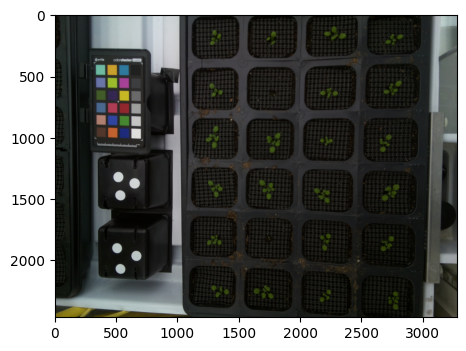

In [3]:
img, path, filename = pcv.readimage(filename=args.image)


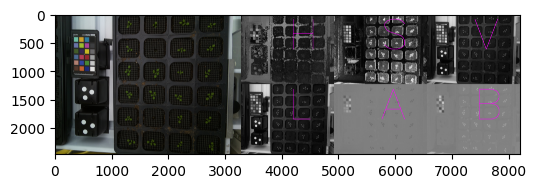

In [4]:
# Update params related to plotting so we can see better 
pcv.params.text_size=50
pcv.params.text_thickness=15

colorspace_img = pcv.visualize.colorspaces(rgb_img=img)


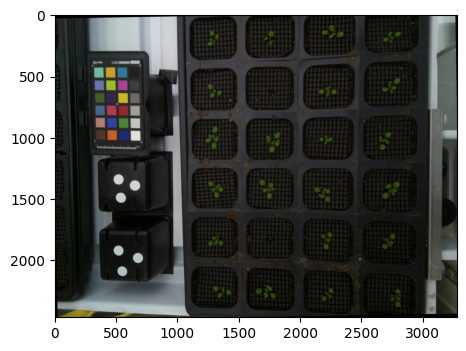

In [5]:
rot_img = pcv.rotate(img=img, rotation_deg=1, crop=True)

<IPython.core.display.Javascript object>


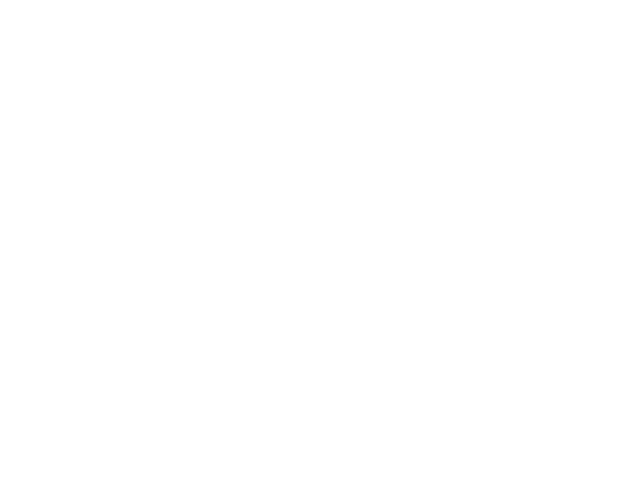

In [6]:
#### Create a mask and begin to clean it ####
%matplotlib notebook
# Change color space for plant extraction
b = pcv.rgb2gray_lab(rgb_img=rot_img, channel="b")


<IPython.core.display.Javascript object>


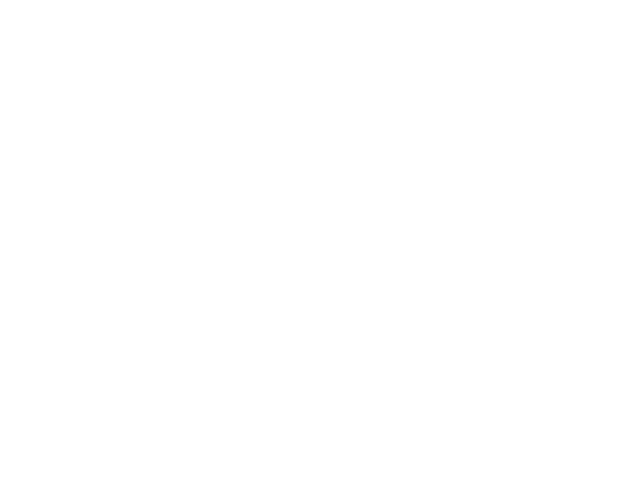

<ggplot: (8735905197877)>


In [7]:
hist = pcv.visualize.histogram(gray_img=b)

<IPython.core.display.Javascript object>


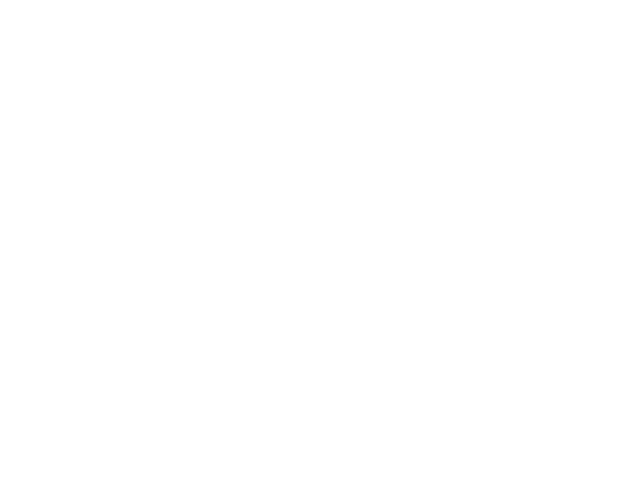

In [8]:
# Threshold
b_thresh = pcv.threshold.binary(gray_img=b, threshold=145, max_value=255, object_type='light')


<IPython.core.display.Javascript object>


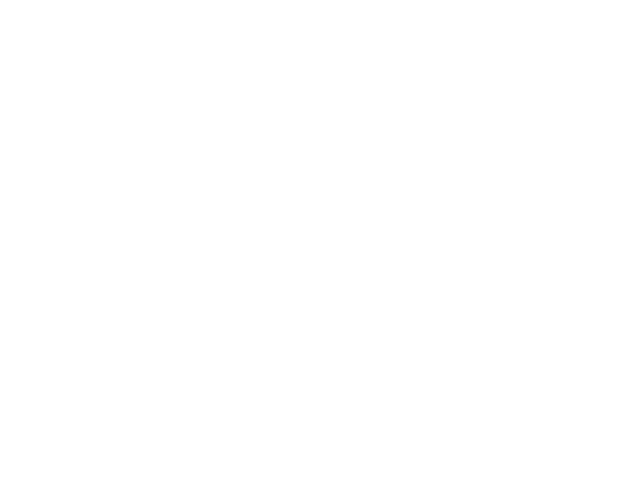

In [9]:
# Fill in small objects 
b_fill_image = pcv.fill(bin_img=b_thresh, size=50)


<IPython.core.display.Javascript object>


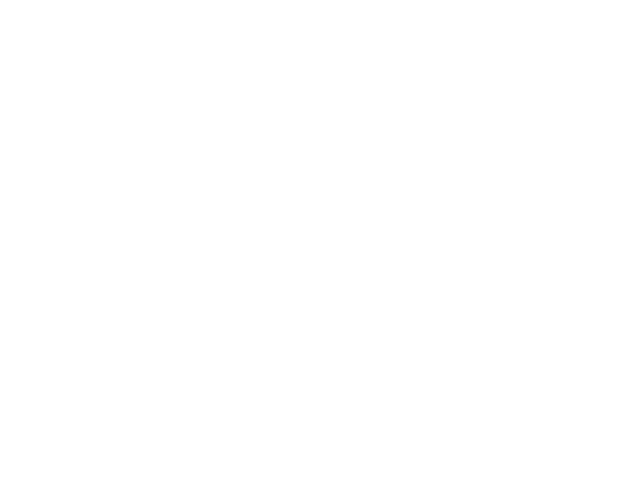

In [10]:
# Dilate 
b_dilated = pcv.dilate(gray_img=b_fill_image, ksize=2, i=1)

<IPython.core.display.Javascript object>


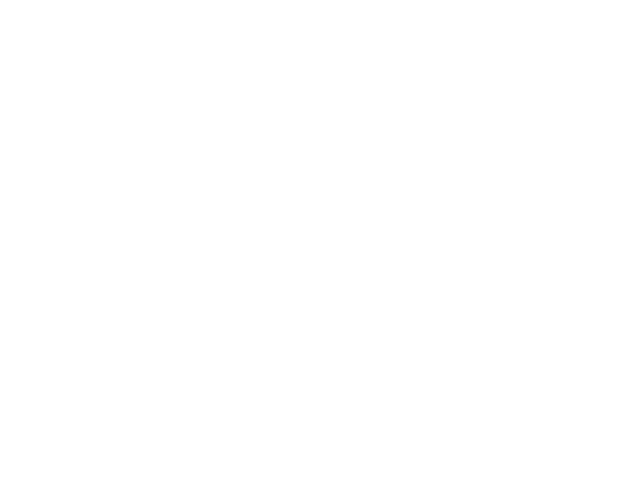

In [11]:
obj, obj_hierarchy = pcv.find_objects(img=rot_img, mask=b_dilated)

<IPython.core.display.Javascript object>


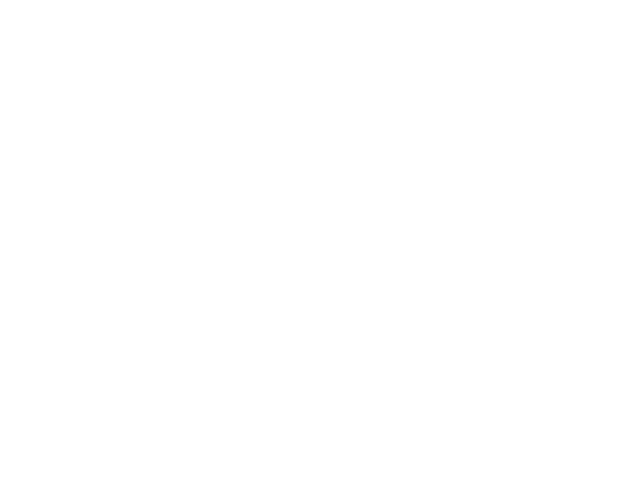

In [12]:
# Create a grid of ROIs 
pcv.params.line_thickness = 10
rois1, roi_hierarchy1 = pcv.roi.multi(img=rot_img, coord=(1260, 155), radius=150, 
                                      spacing=(500, 415), nrows=6, ncols=4)

In [13]:
plant_id = range(0,len(rois1))

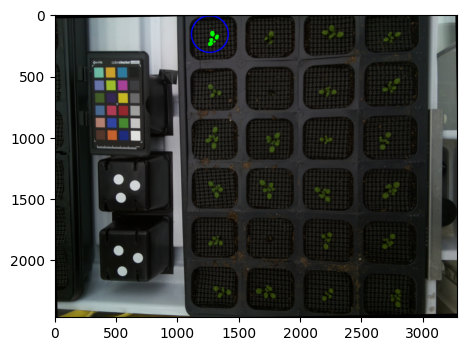

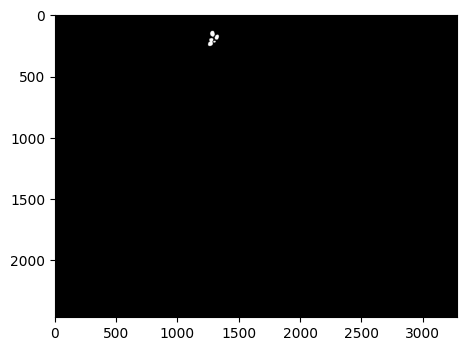

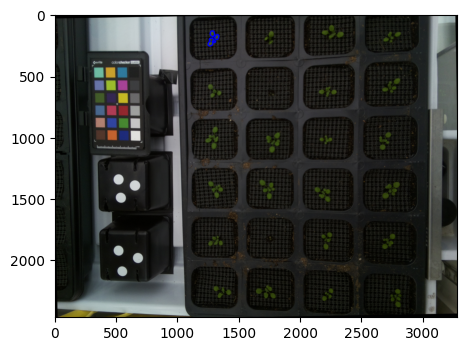

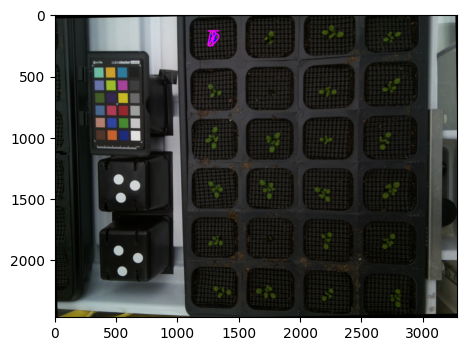

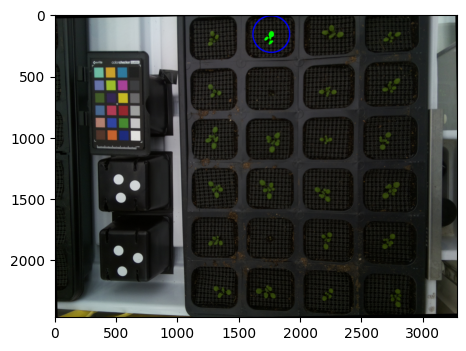

...

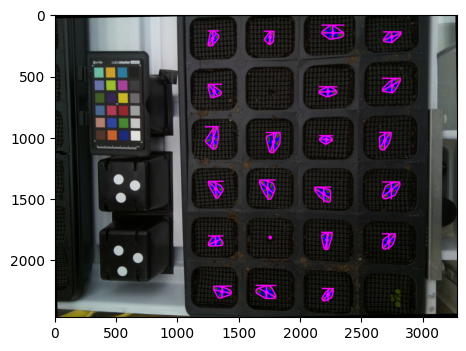

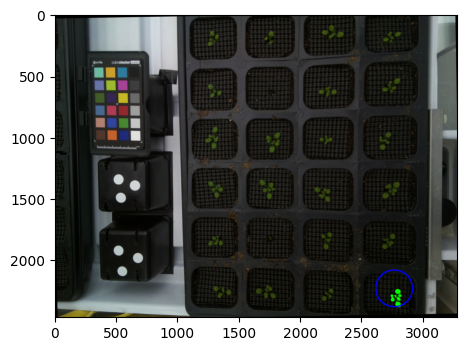

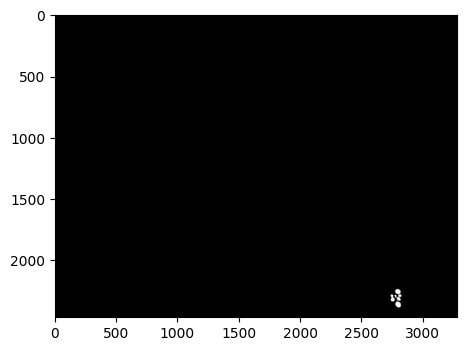

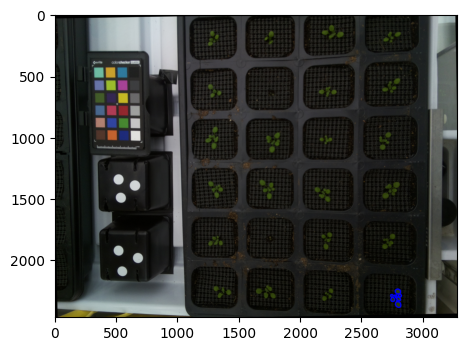

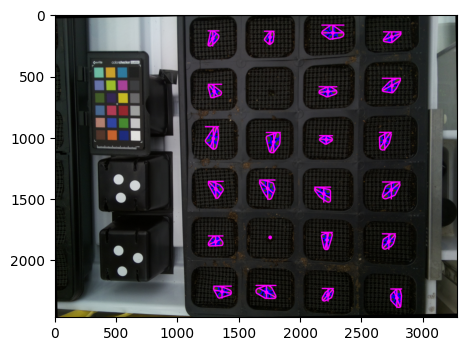

In [14]:
import numpy as np
img_copy = np.copy(rot_img)
%matplotlib inline

for i in range(0, len(rois1)):
    roi = rois1[i]
    hierarchy = roi_hierarchy1[i]
    id_label = plant_id[i]
    # Find objects
    filtered_contours, filtered_hierarchy, filtered_mask, filtered_area = pcv.roi_objects(
        img=rot_img, roi_type="partial", roi_contour=roi, roi_hierarchy=hierarchy, object_contour=obj, 
        obj_hierarchy=obj_hierarchy)

    # Combine objects together in each plant     
    plant_contour, plant_mask = pcv.object_composition(img=rot_img, contours=filtered_contours, hierarchy=filtered_hierarchy)        

    if plant_contour is not None:
        # Analyze the shape of each plant 
        analysis_images = pcv.analyze_object(img=img_copy, obj=plant_contour, mask=plant_mask, label=id_label)

        # Save the image with shape characteristics 
        img_copy = analysis_images


In [15]:
pcv.print_results(filename=args.result)